In [1]:
import zipfile
import os

zip_path = 'archive (1).zip'  # change if your file name/path is different
extract_to = 'belgium_traffic_signs'

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)

print(f"Extracted to {extract_to}")


Extracted to belgium_traffic_signs


In [2]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers
import os
from PIL import Image
from sklearn.model_selection import train_test_split


In [3]:
# Set your dataset directory path
dataset_path = 'belgium_traffic_signs'  # adjust if necessary

image_size = 64  # resizing to 64x64 for manageable GAN training
images = []

def load_images_from_folder(folder):
    imgs = []
    for filename in os.listdir(folder):
        if filename.endswith('.ppm') or filename.endswith('.png') or filename.endswith('.jpg'):
            img_path = os.path.join(folder, filename)
            img = Image.open(img_path).convert('RGB')
            img = img.resize((image_size, image_size))
            imgs.append(np.array(img))
    return imgs

# Load images recursively (depending on dataset folder structure)
for root, dirs, files in os.walk(dataset_path):
    imgs = load_images_from_folder(root)
    images.extend(imgs)

images = np.array(images)
print(f"Total images loaded: {len(images)}")

# Normalize images to [-1, 1] for GAN training
images = (images - 127.5) / 127.5


Total images loaded: 7095


In [4]:
BUFFER_SIZE = 60000
BATCH_SIZE = 64

train_dataset = tf.data.Dataset.from_tensor_slices(images).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)


In [5]:
def make_generator_model():
    model = tf.keras.Sequential()
    model.add(layers.Dense(8*8*256, use_bias=False, input_shape=(100,)))
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())
    
    model.add(layers.Reshape((8, 8, 256)))  # 8x8x256
    
    model.add(layers.Conv2DTranspose(128, (5,5), strides=(2,2), padding='same', use_bias=False))  # 16x16x128
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())
    
    model.add(layers.Conv2DTranspose(64, (5,5), strides=(2,2), padding='same', use_bias=False))  # 32x32x64
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())
    
    model.add(layers.Conv2DTranspose(3, (5,5), strides=(2,2), padding='same', use_bias=False, activation='tanh'))  # 64x64x3
    
    return model

generator = make_generator_model()
generator.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 16384)             1638400   
                                                                 
 batch_normalization (BatchN  (None, 16384)            65536     
 ormalization)                                                   
                                                                 
 re_lu (ReLU)                (None, 16384)             0         
                                                                 
 reshape (Reshape)           (None, 8, 8, 256)         0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 16, 16, 128)      819200    
 nspose)                                                         
                                                                 
 batch_normalization_1 (Batc  (None, 16, 16, 128)      5

In [6]:
def make_discriminator_model():
    model = tf.keras.Sequential()
    model.add(layers.Conv2D(64, (5,5), strides=(2,2), padding='same', input_shape=[64,64,3]))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))
    
    model.add(layers.Conv2D(128, (5,5), strides=(2,2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))
    
    model.add(layers.Flatten())
    model.add(layers.Dense(1))
    
    return model

discriminator = make_discriminator_model()
discriminator.summary()


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 32, 32, 64)        4864      
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 32, 32, 64)        0         
                                                                 
 dropout (Dropout)           (None, 32, 32, 64)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 16, 16, 128)       204928    
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 16, 16, 128)       0         
                                                                 
 dropout_1 (Dropout)         (None, 16, 16, 128)       0         
                                                                 
 flatten (Flatten)           (None, 32768)            

In [7]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)


In [8]:
EPOCHS = 50
noise_dim = 100
num_examples_to_generate = 16

# Seed for consistent image generation during training
seed = tf.random.normal([num_examples_to_generate, noise_dim])

# Checkpoint to save weights during training
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)


In [9]:
@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, noise_dim])
    
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)
        
        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)
        
        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)
    
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    
    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
    
    return gen_loss, disc_loss


In [10]:
def train(dataset, epochs):
    for epoch in range(epochs):
        gen_loss_avg = 0
        disc_loss_avg = 0
        for image_batch in dataset:
            gen_loss, disc_loss = train_step(image_batch)
            gen_loss_avg += gen_loss
            disc_loss_avg += disc_loss
        
        print(f'Epoch {epoch+1}, Generator Loss: {gen_loss_avg/len(dataset):.4f}, Discriminator Loss: {disc_loss_avg/len(dataset):.4f}')
        
        # Produce images for the GIF as we go
        generate_and_save_images(generator, epoch+1, seed)
        
        # Save the model every 10 epochs
        if (epoch + 1) % 10 == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)
            
    # Generate after final epoch
    generate_and_save_images(generator, epochs, seed)


In [11]:
def generate_and_save_images(model, epoch, test_input):
    predictions = model(test_input, training=False)
    
    fig = plt.figure(figsize=(4,4))
    
    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i+1)
        img = (predictions[i] * 127.5 + 127.5).numpy().astype(np.uint8)
        plt.imshow(img)
        plt.axis('off')
        
    plt.suptitle(f'Epoch {epoch}')
    plt.show()


Epoch 1, Generator Loss: 1.7363, Discriminator Loss: 0.4675


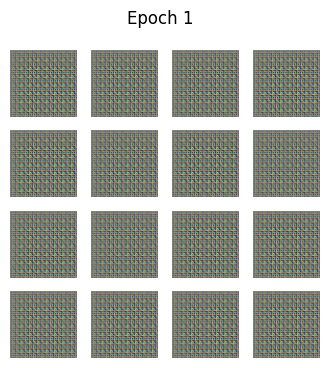

Epoch 2, Generator Loss: 3.1948, Discriminator Loss: 0.1024


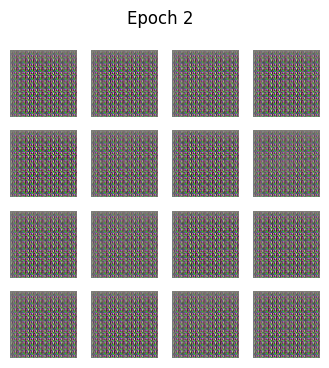

Epoch 3, Generator Loss: 4.5287, Discriminator Loss: 0.0447


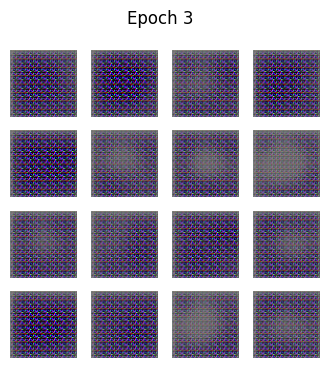

Epoch 4, Generator Loss: 3.7733, Discriminator Loss: 0.1327


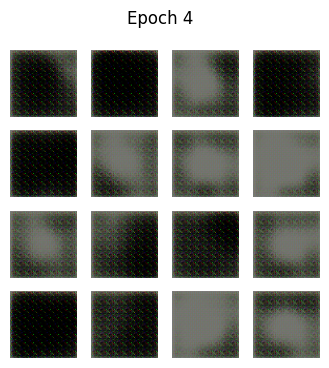

Epoch 5, Generator Loss: 2.7133, Discriminator Loss: 0.3938


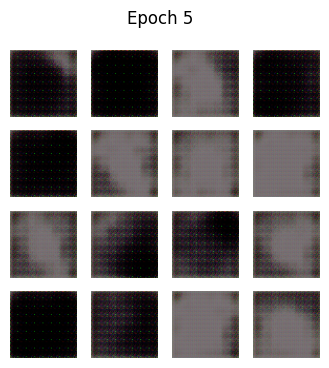

Epoch 6, Generator Loss: 2.3947, Discriminator Loss: 0.3641


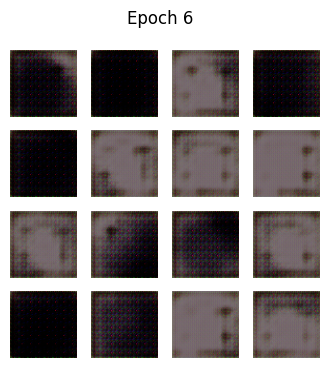

Epoch 7, Generator Loss: 2.6128, Discriminator Loss: 0.3529


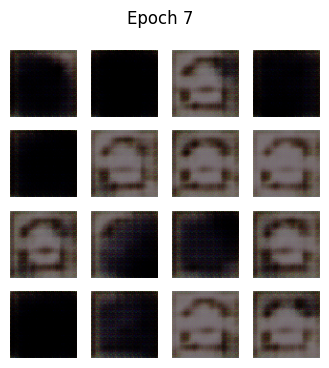

Epoch 8, Generator Loss: 2.5567, Discriminator Loss: 0.3583


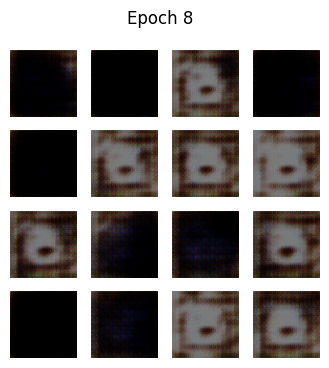

Epoch 9, Generator Loss: 2.4788, Discriminator Loss: 0.4300


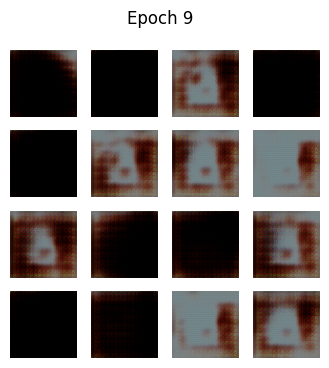

Epoch 10, Generator Loss: 2.6277, Discriminator Loss: 0.5823


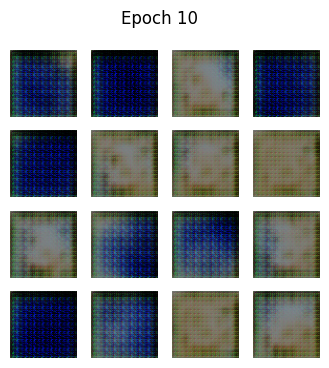

Epoch 11, Generator Loss: 2.4400, Discriminator Loss: 0.4905


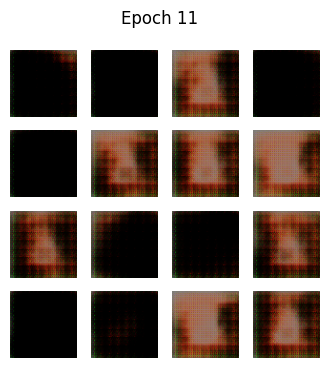

Epoch 12, Generator Loss: 2.3077, Discriminator Loss: 0.5610


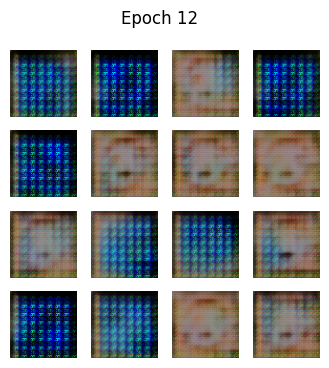

Epoch 13, Generator Loss: 2.4938, Discriminator Loss: 0.7119


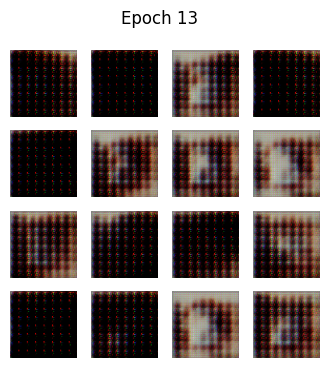

Epoch 14, Generator Loss: 2.8571, Discriminator Loss: 0.4731


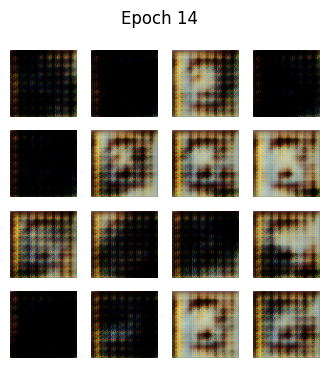

Epoch 15, Generator Loss: 2.2431, Discriminator Loss: 0.6991


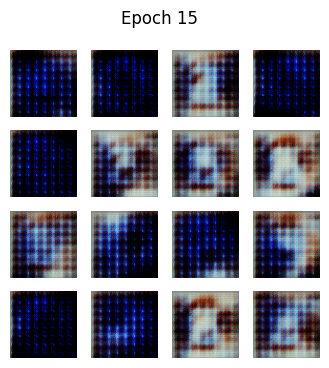

Epoch 16, Generator Loss: 2.3064, Discriminator Loss: 0.6865


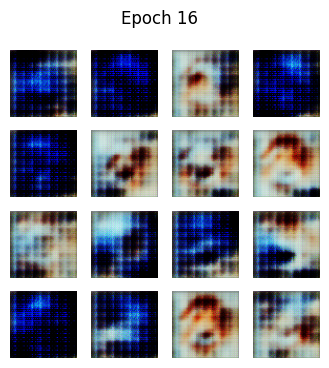

Epoch 17, Generator Loss: 2.0632, Discriminator Loss: 0.7455


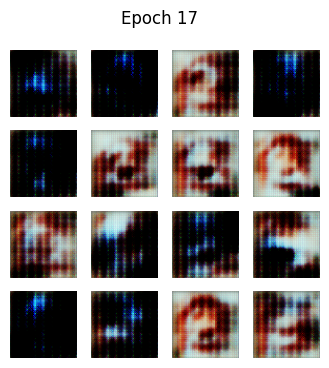

Epoch 18, Generator Loss: 1.9996, Discriminator Loss: 0.6421


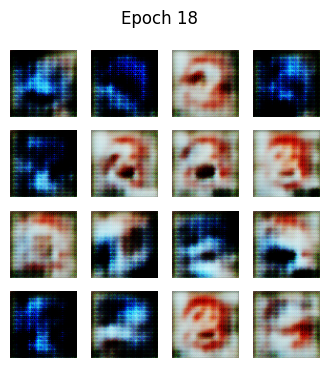

Epoch 19, Generator Loss: 2.1041, Discriminator Loss: 0.6088


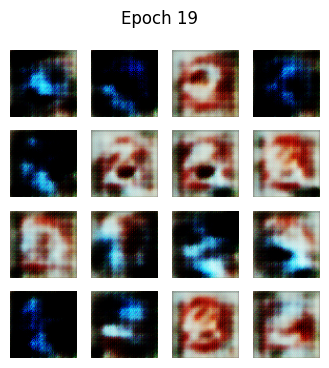

Epoch 20, Generator Loss: 1.9013, Discriminator Loss: 0.6203


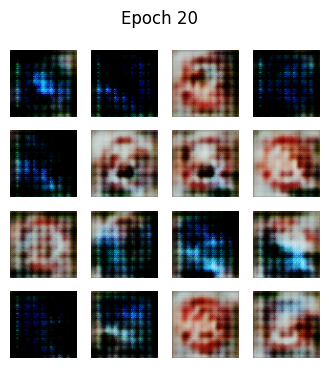

Epoch 21, Generator Loss: 2.2427, Discriminator Loss: 0.5260


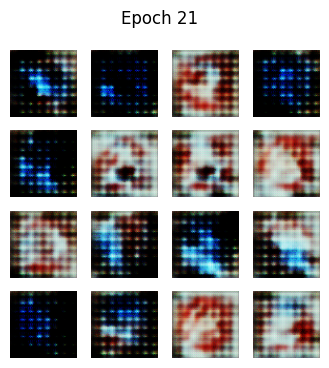

Epoch 22, Generator Loss: 2.1339, Discriminator Loss: 0.6486


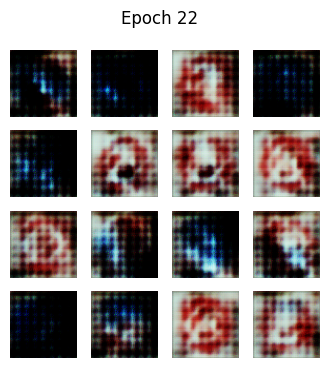

Epoch 23, Generator Loss: 2.2370, Discriminator Loss: 0.6808


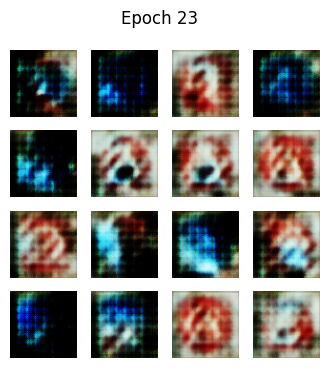

Epoch 24, Generator Loss: 2.4435, Discriminator Loss: 0.6709


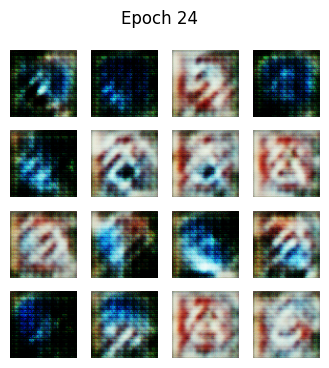

Epoch 25, Generator Loss: 2.0287, Discriminator Loss: 0.7269


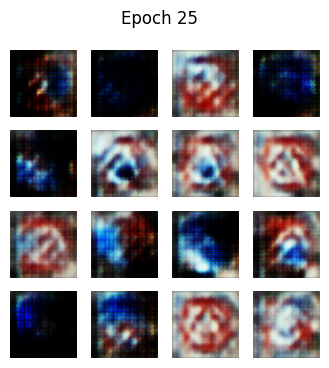

Epoch 26, Generator Loss: 2.4137, Discriminator Loss: 0.7749


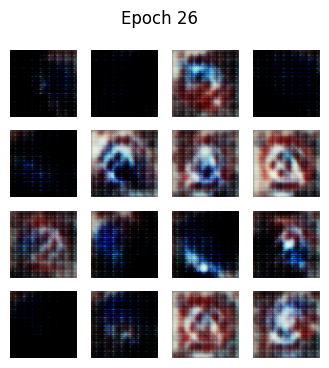

Epoch 27, Generator Loss: 2.4730, Discriminator Loss: 0.5994


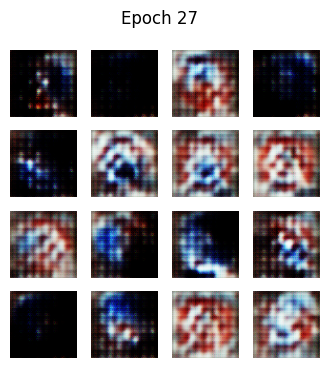

Epoch 28, Generator Loss: 2.2360, Discriminator Loss: 0.5981


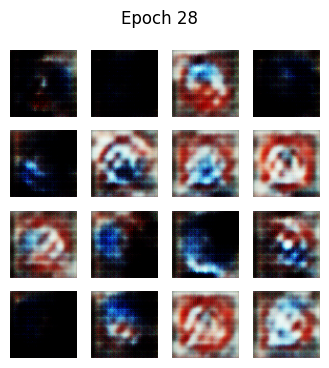

Epoch 29, Generator Loss: 2.2427, Discriminator Loss: 0.7567


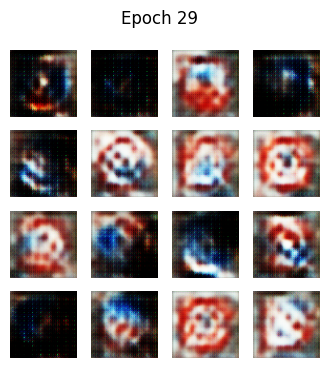

Epoch 30, Generator Loss: 2.1830, Discriminator Loss: 0.7107


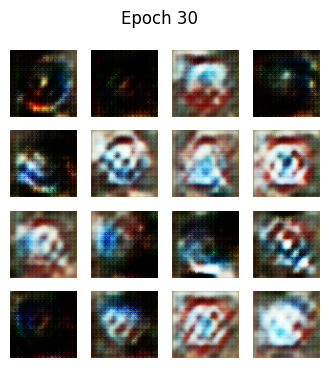

Epoch 31, Generator Loss: 2.0264, Discriminator Loss: 0.7435


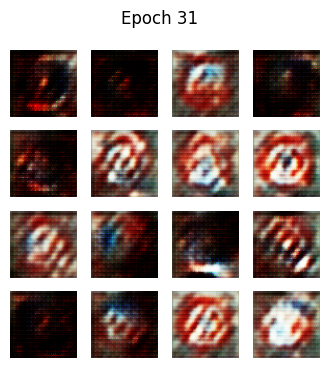

Epoch 32, Generator Loss: 2.2382, Discriminator Loss: 0.7594


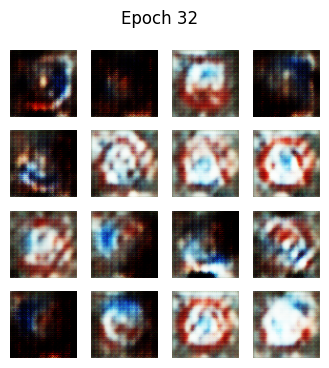

Epoch 33, Generator Loss: 1.9531, Discriminator Loss: 0.7834


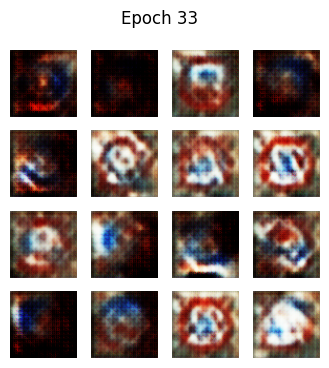

Epoch 34, Generator Loss: 1.8793, Discriminator Loss: 0.7278


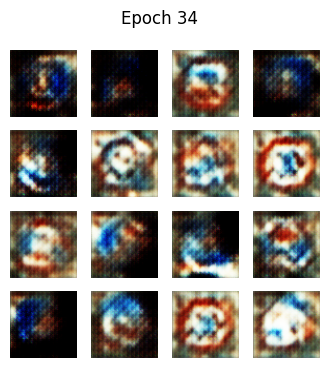

Epoch 35, Generator Loss: 1.6202, Discriminator Loss: 0.8359


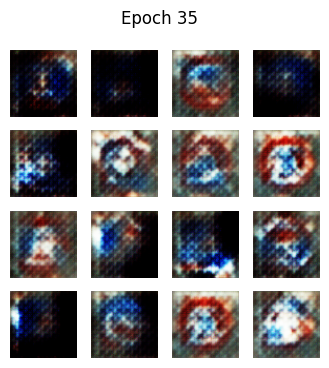

Epoch 36, Generator Loss: 1.5991, Discriminator Loss: 0.8446


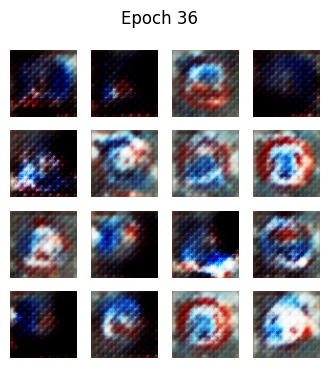

Epoch 37, Generator Loss: 1.5690, Discriminator Loss: 0.8863


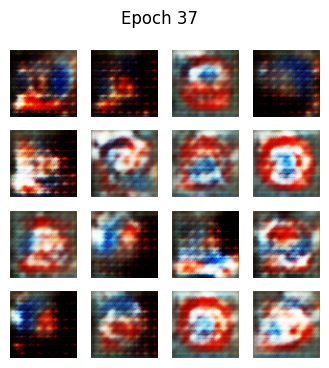

Epoch 38, Generator Loss: 1.6489, Discriminator Loss: 0.8457


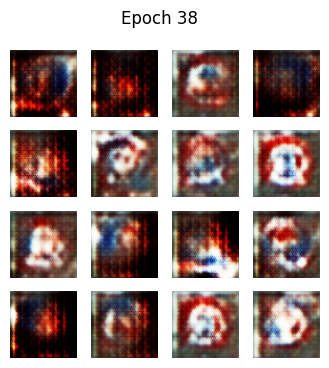

Epoch 39, Generator Loss: 1.4879, Discriminator Loss: 0.9155


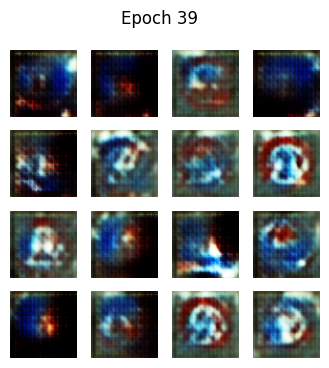

Epoch 40, Generator Loss: 1.7006, Discriminator Loss: 0.8524


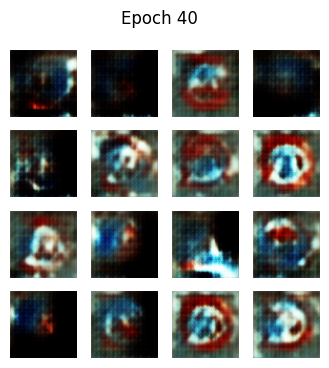

Epoch 41, Generator Loss: 1.6595, Discriminator Loss: 0.8403


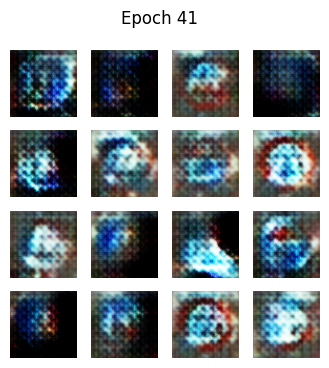

Epoch 42, Generator Loss: 1.7404, Discriminator Loss: 0.7508


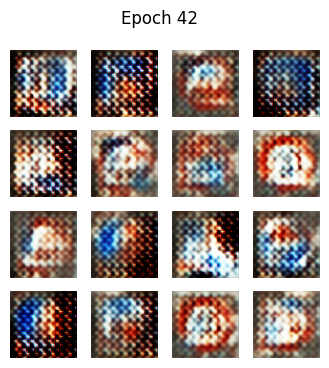

Epoch 43, Generator Loss: 1.5560, Discriminator Loss: 0.9195


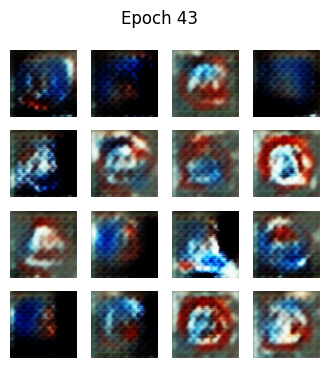

Epoch 44, Generator Loss: 1.6584, Discriminator Loss: 0.7756


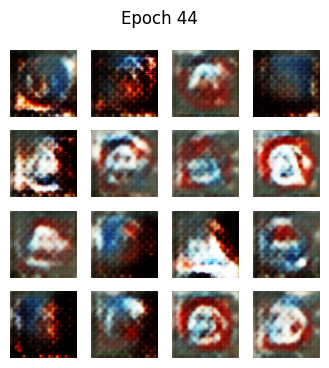

Epoch 45, Generator Loss: 1.6309, Discriminator Loss: 0.8929


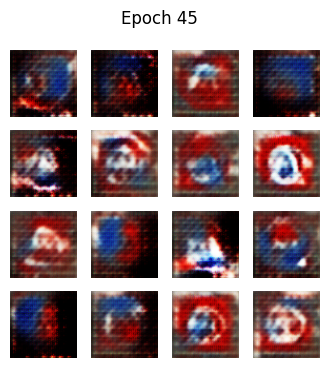

Epoch 46, Generator Loss: 1.7168, Discriminator Loss: 0.9108


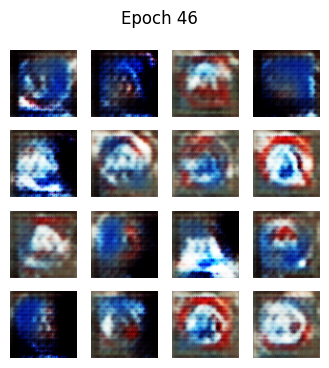

Epoch 47, Generator Loss: 1.5580, Discriminator Loss: 0.8646


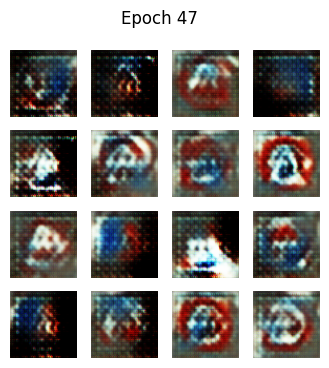

Epoch 48, Generator Loss: 1.5293, Discriminator Loss: 0.9004


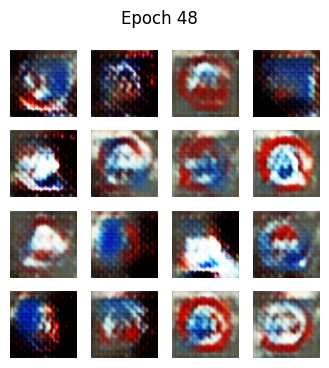

Epoch 49, Generator Loss: 1.5432, Discriminator Loss: 0.8299


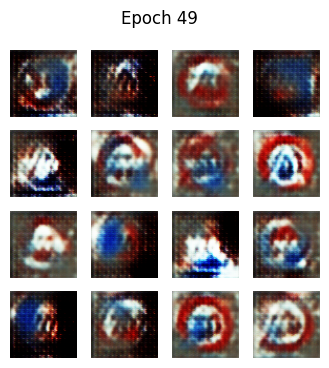

Epoch 50, Generator Loss: 1.5455, Discriminator Loss: 0.8237


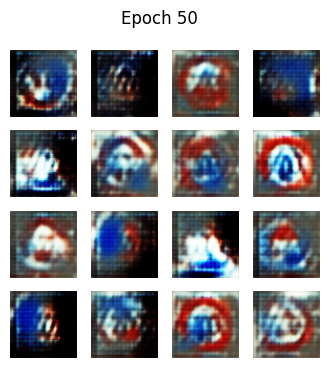

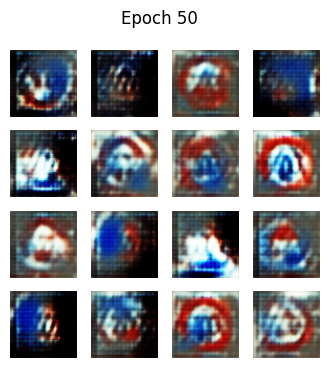

In [12]:
train(train_dataset, EPOCHS)


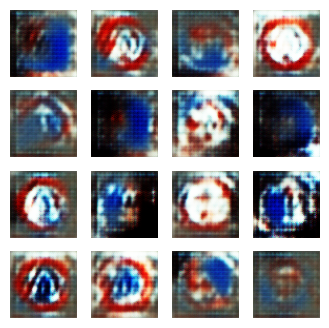

In [13]:
noise = tf.random.normal([16, noise_dim])
generated_images = generator(noise, training=False)

fig = plt.figure(figsize=(4,4))
for i in range(generated_images.shape[0]):
    plt.subplot(4, 4, i+1)
    img = (generated_images[i] * 127.5 + 127.5).numpy().astype(np.uint8)
    plt.imshow(img)
    plt.axis('off')
plt.show()
